In [1]:
import matplotlib.pyplot as plt
from plotly import tools
from mpl_toolkits.mplot3d import Axes3D
import collections
import numpy as np
import plotly as py
import plotly.graph_objs as go
import datetime
from sklearn.model_selection import train_test_split
import pandas as pd
from joblib import load, dump
from scipy import signal
from numpy.linalg import norm, inv
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow import keras
from tensorflow.keras import backend as K
from IPython.lib import backgroundjobs as bg
jobs = bg.BackgroundJobManager()
py.offline.init_notebook_mode(connected = True)


In [2]:
def FindPhoneDataIntervals(phoneData):
    intervals = []
    
    currentInterval = []
    currentCoordinate = None
    multiKeypressInterval = []
    multiKeypressCoordinate = None
    for datum in phoneData:
        if datum['eventID'] == 0:
            currentInterval.append(datum['timeStamp'])
            currentCoordinate = datum['x']
        
        if datum['eventID'] == 5:
            if currentInterval == []:
                currentInterval.append(datum['timeStamp'])
            else:
                multiKeypressInterval.append(datum['timeStamp'])
                multiKeypressCoordinate = datum['x']
        
        if len(currentInterval) == 0 and len(multiKeypressInterval) == 0:
            print("Failed to match a key release with the following time stamp: {}".format(datum['timeStamp']))
            continue
            
        if datum['eventID'] == 1:
            currentInterval.append(datum['timeStamp'])
            intervals.append(currentInterval)
            currentInterval = []
            multiKeypressInterval = []
                
        if datum['eventID'] == 6:
            if len(currentInterval) == 1 and len(multiKeypressInterval) == 1:
                if abs(datum['x'] - multiKeypressCoordinate) < abs(datum['x'] - currentCoordinate):
                    multiKeypressInterval.append(datum['timeStamp'])
                    intervals.append(multiKeypressInterval)
                else:
                    currentInterval.append(datum['timeStamp'])
                    intervals.append(currentInterval)
                    currentInterval = multiKeypressInterval
                    
                multiKeypressInterval = []
                
            else:
                currentInterval.append(datum['timeStamp'])
                intervals.append(currentInterval)
                currentInterval = []
                
            
            
    return intervals

def getKeypressLabels(thumbData, phoneData):
    keypressLabels = np.zeros(len(thumbData))
    
    phoneDataIntervals = FindPhoneDataIntervals(phoneData)
    intervalIndex = 0
    currentInterval = phoneDataIntervals[intervalIndex]
    
    for thumbDataIndex, thumbDatum in thumbData.iterrows():
        while currentInterval[1] < thumbDatum['timeStamp']:
            intervalIndex += 1
            
            if intervalIndex > len(phoneDataIntervals):
                return keypressLabels
            
            currentInterval = phoneDataIntervals[intervalIndex]
        
        if thumbDatum['timeStamp'] >= currentInterval[0] and thumbDatum['timeStamp'] <= currentInterval[1]:
            keypressLabels[thumbDataIndex] = 1
            
        elif thumbDatum['timeStamp'] < currentInterval[0]:
            continue
            
    return keypressLabels
            
            

In [3]:
keyboardDataFileName = 'keyboard_data.txt'
g_thumbKeyboardPositions = collections.defaultdict(np.array)
with open(keyboardDataFileName, 'r') as file:
    for line in file:
        posX, posY, letter = line.split()
        g_thumbKeyboardPositions[letter] = np.array([float(posX), float(posY)])

g_thumbKeyboardPositions[" "] = np.array([900., 850.]) 

def gridCoordinateSearch(coordinate, thumbKeyboardPositions):
    leadingLetters = ["q", "a","z", " "]
    rows = ["qwertyuiop", "asdfghjkl", "zxcvbnm", " "]
    closestRowIndex = min([ind for ind in range(len(leadingLetters))], key = lambda ind: abs(coordinate[1] - thumbKeyboardPositions[leadingLetters[ind]][1]))
    
    closestLetter = min([letter for letter in rows[closestRowIndex]], key = lambda letter: abs(coordinate[0] - thumbKeyboardPositions[letter][0]))
    
    return closestLetter

gridCoordinateSearch(np.array([000.,900.]), g_thumbKeyboardPositions)
        
    

' '

In [4]:
markersDataFileName = "2019-03-13-15-18-38-752_markers_left.txt"
phoneDataFileName = "2019-03-13-15-18-38-747_left.txt"

In [5]:
markersData = []
phoneData = []

with open(phoneDataFileName, 'r') as file:
    itemHeaders = ["timeStamp", "logIndex", "keyboardID", "eventID", "x", "y"]
    for line in file:
        logEntry = line.split()
        if len(logEntry) == len(itemHeaders):
            phoneDatum = {itemName: data for itemName, data in zip(itemHeaders, logEntry)}
            phoneDatum["timeStamp"] = datetime.datetime.strptime(phoneDatum["timeStamp"], "%Y-%m-%d-%H-%M-%S-%f")
            phoneDatum["eventID"] = int(phoneDatum["eventID"])
            phoneDatum["logIndex"] = int(phoneDatum["logIndex"])
            phoneDatum["x"] = float(phoneDatum["x"])
            phoneDatum["y"] = float(phoneDatum["y"])          
            phoneData.append(phoneDatum)
        
with open(markersDataFileName, 'r') as file:
    itemHeaders = ["timeStamp", "logIndex", "markerID", "x", "y", "z"]
    for line in file:
        if logEntry != "":
            logEntry = line.split()
            if len(logEntry) == len(itemHeaders):
                timeStamp = datetime.datetime.strptime(logEntry[0], "%Y-%m-%d-%H-%M-%S-%f")
                if timeStamp >= phoneData[0]['timeStamp'] and timeStamp <= phoneData[-1]['timeStamp']:
                    markersDatum = {itemName: data for itemName, data in zip(itemHeaders, logEntry)}
                    markersDatum["timeStamp"] = timeStamp
                    markersDatum["markerID"] = int(markersDatum["markerID"])
                    markersDatum["logIndex"] = int(markersDatum["logIndex"])
                    markersDatum["x"] = float(markersDatum["x"])
                    markersDatum["y"] = float(markersDatum["y"])
                    markersDatum['z'] = float(markersDatum['z'])
                    markersData.append(markersDatum)

markersDataDictByID = collections.defaultdict(list)

for markersDatum in markersData:
    markersDataDictByID[markersDatum['markerID']].append(markersDatum)

In [7]:
plotData = collections.defaultdict(list)
markersData.sort(key = lambda datum:datum['timeStamp'])
for data in markersData[:20000]:
    plotData[data["markerID"]].append([float(data['x']), float(data['y']), float(data['z'])])

traces = []
for markerID, trajectory in plotData.items():
    trajectory = np.array(trajectory)
    trace = go.Scatter3d(
        x=trajectory[:,0],
        y=trajectory[:,1],
        z=trajectory[:,2],
        mode='lines',
        name = markerID
    )
    traces.append(trace)
    
fig = go.Figure(data = traces)

py.offline.plot(fig, filename = "left hand trajectory")

'file://C:\\Users\\Dave Lei\\Part IIB project\\Data logging\\left hand trajectory.html'

In [6]:
tipMarkerIDs = [53641]
middleMarkerIDs = [53639]
endMarkerIDs = [53640]


topMarkerLeftID = 50090
topMarkerRightID = 51020
sideMarkerLeftID = 51035

g_calibrationPositions = []

for markerID in [topMarkerLeftID, topMarkerRightID, sideMarkerLeftID]:
    position = np.array([markersDataDictByID[markerID][0][direction] for direction in ['x', 'y', 'z']])
    g_calibrationPositions.append(position)
    
g_referencePoint = g_calibrationPositions[0]

In [7]:
g_calibrationPositions

[array([-0.1140549,  0.7822315,  0.5233968]),
 array([-4.368773e-04,  7.746820e-01,  5.187351e-01]),
 array([-0.1395462,  0.7658004,  0.5194354])]

In [8]:
# CalibrationPosition 0 and 1: Left Top Marker , Right Top Marker, 2: Left Side Marker
def findRotationMatrix(calibrationPositions):
    vector1 = calibrationPositions[1] - calibrationPositions[0]
    vector2 = calibrationPositions[2] - calibrationPositions[0]
    
    yVector = np.cross(vector1, vector2)
    
    xRowVector = vector1 / norm(vector1)
    yRowVector = yVector/ norm(yVector)
    zRowVector = np.cross(xRowVector, yRowVector)
    
    inverseTransform = np.array([xRowVector, yRowVector, zRowVector]).transpose()
    
    transformMatrix = inv(inverseTransform)
    return transformMatrix
    
g_rotationMatrix = findRotationMatrix(g_calibrationPositions)


In [9]:
from copy import deepcopy

tipMarkerData, middleMarkerData, endMarkerData = [], [], []

def changeDataReference(datum): 
    oldPosition = np.array([datum['x'], datum['y'], datum['z']]).transpose()
    newX, newY, newZ = np.matmul(g_rotationMatrix, oldPosition - g_referencePoint)
    return newX, newY, newZ


for markerID in tipMarkerIDs:
    for datum in markersDataDictByID[markerID]:
        new_datum = deepcopy(datum)
        new_datum['x'], new_datum['y'], new_datum['z'] = changeDataReference(datum)
        tipMarkerData.append(new_datum)
        
for markerID in middleMarkerIDs:
    for datum in markersDataDictByID[markerID]:
        new_datum = deepcopy(datum)
        new_datum['x'], new_datum['y'], new_datum['z'] = changeDataReference(datum)
        middleMarkerData.append(new_datum)
        
for markerID in endMarkerIDs:
    for datum in markersDataDictByID[markerID]:
        new_datum = deepcopy(datum)
        new_datum['x'], new_datum['y'], new_datum['z'] = changeDataReference(datum)
        endMarkerData.append(new_datum)
    
    



In [10]:
df_tip = pd.DataFrame(tipMarkerData, columns = ['timeStamp', 'x', 'y', 'z'])
df_mid = pd.DataFrame(middleMarkerData, columns = ['timeStamp', 'x', 'y', 'z'])
df_end = pd.DataFrame(endMarkerData, columns = ['timeStamp', 'x', 'y', 'z'])

    
df_threeMarkers = pd.merge(pd.merge(df_tip, df_mid, on='timeStamp', how = 'inner', suffixes = ['_tip', '_mid']), df_end, on = 'timeStamp', how = 'inner')
df_threeMarkers['label'] = getKeypressLabels(df_threeMarkers, phoneData)


In [11]:
deltaTime = np.diff(df_threeMarkers['timeStamp']) / np.timedelta64(1, 's')

df_threeMarkersWithSpeed = df_threeMarkers.copy()
for name, column in df_threeMarkers.iteritems():
    if name != 'timeStamp' and name != 'label':
        speed = pd.DataFrame(np.divide(np.diff(df_threeMarkers[name]),deltaTime), columns = ['delta_{}'.format(name)])
        speed.index += 1
        df_threeMarkersWithSpeed = pd.merge(df_threeMarkersWithSpeed, speed, left_index=True, right_index=True)
        
df_threeMarkersWithSpeed = df_threeMarkersWithSpeed.replace([np.inf, -np.inf], np.nan).dropna()

C:\Users\Dave Lei\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning:

divide by zero encountered in true_divide

C:\Users\Dave Lei\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning:

invalid value encountered in true_divide



In [12]:
dump(df_threeMarkersWithSpeed, "left_trainining_processed_data")

['left_trainining_processed_data']

In [12]:
deltaTime = np.diff(df_threeMarkersWithSpeed['timeStamp']) / np.timedelta64(1, 's')
accel = (np.divide(np.diff(df_threeMarkersWithSpeed['delta_y_tip']),deltaTime))

In [13]:
len(df_threeMarkers)

153260

In [56]:
speedYTrace = go.Scatter(
    x = df_threeMarkersWithSpeed['timeStamp'][40000:50000],
    y = df_threeMarkersWithSpeed['delta_y_tip'][40000:50000],
    mode = 'lines+markers',
    name = 'speedMarkerY'
)

labelTrace = go.Scatter(
    x = df_threeMarkersWithSpeed['timeStamp'][40000:50000],
    y = df_threeMarkersWithSpeed['label'][40000:50000],
    mode = 'markers',
    name = 'label'
)

phoneDataTrace = go.Scatter(
    x = [datum['timeStamp'] for datum in phoneData],
    y = [datum['eventID'] for datum in phoneData],
    mode = 'markers',
    name = 'label'
)


#data = [accelYTrace]
data = [speedYTrace, labelTrace, phoneDataTrace]
fig = go.Figure(data = data)

py.offline.iplot(fig, filename = "leftAccelYTrace")

In [13]:
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
test_size = 0.2

#features = ['y_tip', 'delta_y_tip', 'z_tip', 'delta_z_tip', 'x_tip', 'delta_x_tip']
features = [name for name, column in df_threeMarkersWithSpeed.iteritems() if name != 'timeStamp' and name != 'label']

X_train, X_test, y_train, y_test = train_test_split(df_threeMarkersWithSpeed[features], df_threeMarkersWithSpeed['label'], test_size = test_size)

In [23]:
X_train[:30]

,x_tip,y_tip,z_tip,x_mid,y_mid,z_mid,x,y,z,delta_x_tip,delta_y_tip,delta_z_tip,delta_x_mid,delta_y_mid,delta_z_mid,delta_x,delta_y,delta_z
14582,0.037890,0.024971,-0.029908,0.044538,0.057110,-0.038422,0.044301,0.086743,-0.053854,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
44641,0.036426,0.019354,-0.023583,0.041278,0.053251,-0.029241,0.041664,0.083025,-0.045438,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
43576,0.058591,0.021506,-0.030898,0.058429,0.055136,-0.034638,0.053803,0.086301,-0.048392,0.091991,-0.006330,-0.096912,0.073805,0.002303,-0.088019,0.039472,0.006989,-0.057015
54749,0.029963,0.020988,-0.024173,0.037190,0.053303,-0.029423,0.039906,0.083825,-0.045133,-0.000107,0.038849,0.035390,-0.006479,0.046826,0.038245,0.004423,0.037634,0.022463
126789,0.034508,0.025277,-0.020494,0.041234,0.057606,-0.025513,0.043231,0.088228,-0.038512,-0.014470,0.011422,0.025143,-0.010238,0.002384,0.013430,-0.001830,0.001528,0.007146
105015,0.046876,0.024898,-0.022665,0.055410,0.057670,-0.026780,0.060533,0.087996,-0.042133,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
19544,0.028127,0.023841,-0.019672,0.038152,0.056689,-0.025738,0.044307,0.085278,-0.043722,-0.066730,-0.168444,-0.366904,-0.067655,-0.115926,-0.198433,-0.040105,-0.023282,-0.120377
108573,0.045833,0.022310,-0.026398,0.049679,0.055892,-0.030397,0.048864,0.087054,-0.045299,-0.022479,0.003133,0.006288,-0.014048,-0.003106,-0.001127,-0.010973,-0.005784,0.001126
74097,0.014292,0.021454,-0.027752,0.024232,0.050267,-0.035797,0.031478,0.078706,-0.051558,-0.002346,0.000592,-0.013355,0.007505,-0.006559,-0.008763,-0.002469,0.001428,-0.005245
16297,0.014806,0.024918,-0.015065,0.027452,0.054221,-0.026027,0.033372,0.081382,-0.043885,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [21]:
y_train[:30]

14582     0.0
44641     1.0
43576     0.0
54749     1.0
126789    0.0
105015    0.0
19544     0.0
108573    0.0
74097     0.0
16297     0.0
134649    0.0
37440     0.0
15838     0.0
153226    0.0
55732     0.0
60772     0.0
137566    0.0
33641     0.0
110412    0.0
97690     0.0
127129    0.0
150171    0.0
76510     0.0
78449     0.0
67462     1.0
22649     0.0
130741    0.0
141910    0.0
22382     0.0
104658    1.0
Name: label, dtype: float64

In [145]:
from IPython.lib import backgroundjobs as bg
NN_clf = MLPClassifier((10))
jobs = bg.BackgroundJobManager()

jobs.new('NN_clf.fit(np.array(X_train), np.array(y_train))')
jobs.status()

Running jobs:
0 : NN_clf.fit(np.array(X_train), np.array(y_train))



In [147]:
jobs()

Completed jobs:
0 : NN_clf.fit(np.array(X_train), np.array(y_train))



In [24]:
# All features
from sklearn.metrics import classification_report

print(classification_report(y_train, NN_clf.predict(X_train)))
print(classification_report(y_test, NN_clf.predict(X_test)))

              precision    recall  f1-score   support

         0.0       0.98      0.95      0.97    100465
         1.0       0.81      0.89      0.85     21522

   micro avg       0.94      0.94      0.94    121987
   macro avg       0.89      0.92      0.91    121987
weighted avg       0.95      0.94      0.94    121987

              precision    recall  f1-score   support

         0.0       0.98      0.95      0.96     25174
         1.0       0.80      0.89      0.84      5323

   micro avg       0.94      0.94      0.94     30497
   macro avg       0.89      0.92      0.90     30497
weighted avg       0.95      0.94      0.94     30497



In [25]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(NN_clf, df_threeMarkersWithSpeed[features], df_threeMarkersWithSpeed['label'], cv = 5)

In [23]:
# only tip features with y and z
from sklearn.metrics import classification_report

print(classification_report(y_train, NN_clf_tip_only.predict(X_train)))
print(classification_report(y_test, NN_clf_tip_only.predict(X_test)))

              precision    recall  f1-score   support

         0.0       0.93      0.97      0.95    100385
         1.0       0.83      0.65      0.73     21602

   micro avg       0.91      0.91      0.91    121987
   macro avg       0.88      0.81      0.84    121987
weighted avg       0.91      0.91      0.91    121987

              precision    recall  f1-score   support

         0.0       0.93      0.97      0.95     25254
         1.0       0.82      0.63      0.71      5243

   micro avg       0.91      0.91      0.91     30497
   macro avg       0.87      0.80      0.83     30497
weighted avg       0.91      0.91      0.91     30497



In [28]:
# only tip features with x, y, and z
from sklearn.metrics import classification_report

print(classification_report(y_train, NN_clf_tip_only.predict(X_train)))
print(classification_report(y_test, NN_clf_tip_only.predict(X_test)))

              precision    recall  f1-score   support

         0.0       0.97      0.95      0.96    100582
         1.0       0.78      0.85      0.82     21405

   micro avg       0.93      0.93      0.93    121987
   macro avg       0.88      0.90      0.89    121987
weighted avg       0.94      0.93      0.93    121987

              precision    recall  f1-score   support

         0.0       0.97      0.95      0.96     25057
         1.0       0.78      0.85      0.81      5440

   micro avg       0.93      0.93      0.93     30497
   macro avg       0.87      0.90      0.88     30497
weighted avg       0.93      0.93      0.93     30497



In [35]:
# only tip features with x, y, and z
from sklearn.metrics import classification_report

print(classification_report(y_train, NN_clf_tip_only.predict(X_train)))
print(classification_report(y_test, NN_clf_tip_only.predict(X_test)))

              precision    recall  f1-score   support

         0.0       0.97      0.96      0.96    100536
         1.0       0.81      0.88      0.84     21451

   micro avg       0.94      0.94      0.94    121987
   macro avg       0.89      0.92      0.90    121987
weighted avg       0.94      0.94      0.94    121987

              precision    recall  f1-score   support

         0.0       0.97      0.95      0.96     25103
         1.0       0.80      0.88      0.84      5394

   micro avg       0.94      0.94      0.94     30497
   macro avg       0.89      0.91      0.90     30497
weighted avg       0.94      0.94      0.94     30497



In [148]:
# All features with transformation matrix
from sklearn.metrics import classification_report

print(classification_report(y_train, NN_clf.predict(X_train)))
print(classification_report(y_test, NN_clf.predict(X_test)))

              precision    recall  f1-score   support

         0.0       0.97      0.96      0.97    100531
         1.0       0.83      0.87      0.85     21456

   micro avg       0.95      0.95      0.95    121987
   macro avg       0.90      0.92      0.91    121987
weighted avg       0.95      0.95      0.95    121987

              precision    recall  f1-score   support

         0.0       0.97      0.96      0.97     25108
         1.0       0.82      0.87      0.85      5389

   micro avg       0.94      0.94      0.94     30497
   macro avg       0.90      0.92      0.91     30497
weighted avg       0.95      0.94      0.94     30497



In [149]:
dump(NN_clf, "NN_left_clf_relative_to_screen.joblib")

['NN_left_clf_relative_to_screen.joblib']

In [87]:
len(X_test)

30497

In [89]:
from sklearn.svm import SVC
SVM_clf = SVC(gamma = 'auto', class_weight = 'balanced')

jobs.new('SVM_clf.fit(np.array(X_test), np.array(y_test))')
jobs.status()

Running jobs:
2 : SVM_clf.fit(np.array(X_test), np.array(y_test))

Completed jobs:
0 : NN_clf.fit(np.array(X_train), np.array(y_train))



In [93]:
# All features with transformation matrix
from sklearn.metrics import classification_report

print(classification_report(y_train, SVM_clf.predict(X_train)))
print(classification_report(y_test, SVM_clf.predict(X_test)))

              precision    recall  f1-score   support

         0.0       0.94      0.79      0.86    100482
         1.0       0.43      0.75      0.55     21505

   micro avg       0.78      0.78      0.78    121987
   macro avg       0.68      0.77      0.70    121987
weighted avg       0.85      0.78      0.80    121987

              precision    recall  f1-score   support

         0.0       0.94      0.79      0.86     25157
         1.0       0.43      0.75      0.55      5340

   micro avg       0.78      0.78      0.78     30497
   macro avg       0.68      0.77      0.70     30497
weighted avg       0.85      0.78      0.80     30497



# Extract with wavelets

In [25]:
import seaborn as sns

In [36]:
positionHeaders = ['x_tip', 'y_tip', 'z_tip']
rawPosSeries = df_threeMarkers[positionHeaders][:80000]

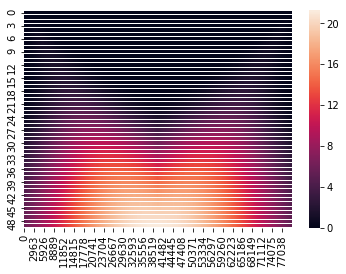

In [37]:
widths = np.linspace(1, 40000, 50)
cwtmatr = signal.cwt(rawPosSeries['y_tip'], signal.ricker, widths)
sns.heatmap(np.square(cwtmatr))

# Tensorflow model

In [24]:
from sklearn.utils import class_weight
input_dimension = X_train.shape[1]
weights = class_weight.compute_class_weight('balanced', 
                                            np.unique(y_train),
                                           y_train)

print(weights)

[0.60691861 2.83822708]


In [139]:
tf_model = tf.keras.Sequential()
tf_model.add(layers.Dense(10, activation='relu', input_dim = input_dimension))
tf_model.add(layers.Dense(1, activation = 'sigmoid'))

def focal_loss(gamma=2, alpha=0.75):
    def focal_loss_fixed(y_true, y_pred):#with tensorflow
            eps = 1e-12
            y_pred=K.clip(y_pred,eps,1.-eps)#improve the stability of the focal loss and see issues 1 for more information
            pt_1 = tf.where(tf.equal(y_true, 1), y_pred, tf.ones_like(y_pred))
            pt_0 = tf.where(tf.equal(y_true, 0), y_pred, tf.zeros_like(y_pred))
            return -K.sum(alpha * K.pow(1. - pt_1, gamma) * K.log(pt_1))-K.sum((1-alpha) * K.pow( pt_0, gamma) * K.log(1. - pt_0))
    return focal_loss_fixed

tf_model.compile(loss=focal_loss(), optimizer = 'adam', metrics=['accuracy'])

In [140]:
tf_model.fit(X_train, y_train, epochs=3000, batch_size = len(X_train) // 10)

Epoch 1/3000
121987/121987 [==============================] - 0s 2us/sample - loss: 706.8637 - acc: 0.8039
Epoch 2/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 697.3311 - acc: 0.8168
Epoch 3/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 690.5402 - acc: 0.8199
Epoch 4/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 686.0385 - acc: 0.8209
Epoch 5/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 682.4483 - acc: 0.8211
Epoch 6/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 678.3540 - acc: 0.8209
Epoch 7/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 672.8861 - acc: 0.8199
Epoch 8/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 668.5469 - acc: 0.8183
Epoch 9/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 664.6251 - acc: 0.8171
Epoch 10/3000
121987/121987 [========

121987/121987 [==============================] - 0s 1us/sample - loss: 416.5613 - acc: 0.8817
Epoch 152/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 415.3707 - acc: 0.8823
Epoch 153/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 414.1026 - acc: 0.8824
Epoch 154/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 412.8681 - acc: 0.8829
Epoch 155/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 411.6657 - acc: 0.8833
Epoch 156/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 410.4620 - acc: 0.8832
Epoch 157/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 409.2341 - acc: 0.8839
Epoch 158/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 408.0175 - acc: 0.8842
Epoch 159/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 406.7531 - acc: 0.8845
Epoch 160/3000
121987/121987 [====

121987/121987 [==============================] - 0s 1us/sample - loss: 279.9156 - acc: 0.9126
Epoch 300/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 279.2205 - acc: 0.9133
Epoch 301/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 278.5131 - acc: 0.9133
Epoch 302/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 277.9737 - acc: 0.9134
Epoch 303/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 277.4212 - acc: 0.9132
Epoch 304/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 276.8450 - acc: 0.9138
Epoch 305/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 276.3130 - acc: 0.9132
Epoch 306/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 275.9705 - acc: 0.9135
Epoch 307/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 275.1872 - acc: 0.9138
Epoch 308/3000
121987/121987 [====

121987/121987 [==============================] - 0s 1us/sample - loss: 225.5909 - acc: 0.9237
Epoch 449/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 225.3793 - acc: 0.9236
Epoch 450/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 225.0052 - acc: 0.9233
Epoch 451/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 224.7710 - acc: 0.9236
Epoch 452/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 224.5074 - acc: 0.9237
Epoch 453/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 224.3088 - acc: 0.9241
Epoch 454/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 224.1167 - acc: 0.9238
Epoch 455/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 223.8741 - acc: 0.9240
Epoch 456/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 223.6353 - acc: 0.9240
Epoch 457/3000
121987/121987 [====

121987/121987 [==============================] - 0s 1us/sample - loss: 202.3690 - acc: 0.9297
Epoch 598/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 202.3337 - acc: 0.9296
Epoch 599/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 202.2308 - acc: 0.9298
Epoch 600/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 202.1466 - acc: 0.9299
Epoch 601/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 202.1587 - acc: 0.9297
Epoch 602/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 201.9838 - acc: 0.9298
Epoch 603/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 201.8379 - acc: 0.9295
Epoch 604/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 201.9162 - acc: 0.9298
Epoch 605/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 201.7365 - acc: 0.9299
Epoch 606/3000
121987/121987 [====

121987/121987 [==============================] - 0s 1us/sample - loss: 193.9853 - acc: 0.9323
Epoch 748/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 193.9603 - acc: 0.9319
Epoch 749/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 193.8381 - acc: 0.9326
Epoch 750/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 193.8051 - acc: 0.9325
Epoch 751/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 194.0210 - acc: 0.9323
Epoch 752/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 193.9200 - acc: 0.9322
Epoch 753/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 193.7745 - acc: 0.9322
Epoch 754/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 193.8447 - acc: 0.9319
Epoch 755/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 193.9679 - acc: 0.9323
Epoch 756/3000
121987/121987 [====

121987/121987 [==============================] - 0s 1us/sample - loss: 190.2097 - acc: 0.9332
Epoch 898/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 190.2007 - acc: 0.9338
Epoch 899/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 190.0121 - acc: 0.9337
Epoch 900/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 190.0017 - acc: 0.9334
Epoch 901/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 190.0329 - acc: 0.9334
Epoch 902/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 190.0168 - acc: 0.9334
Epoch 903/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 190.1173 - acc: 0.9334
Epoch 904/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 190.0550 - acc: 0.9336
Epoch 905/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 189.9830 - acc: 0.9335
Epoch 906/3000
121987/121987 [====

121987/121987 [==============================] - 0s 1us/sample - loss: 187.9328 - acc: 0.9350
Epoch 1047/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 187.9227 - acc: 0.9342
Epoch 1048/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 187.8711 - acc: 0.9344
Epoch 1049/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 187.8341 - acc: 0.9348
Epoch 1050/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 187.8587 - acc: 0.9346
Epoch 1051/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 187.9096 - acc: 0.9344
Epoch 1052/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 187.8223 - acc: 0.9342
Epoch 1053/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 187.8919 - acc: 0.9343
Epoch 1054/3000
121987/121987 [==============================] - 0s 1us/sample - loss: 187.8726 - acc: 0.9345
Epoch 1055/3000
121987/121

KeyboardInterrupt: 

In [123]:
np.round(tf_model.predict(X_test))

array([[0.],
       [1.],
       [0.],
       ...,
       [0.],
       [0.],
       [0.]], dtype=float32)

In [74]:
# All features with transformation matrix
from sklearn.metrics import classification_report

print(classification_report(y_train, np.rint(tf_model.predict(X_train))))
print(classification_report(y_test, np.rint(tf_model.predict(X_test))))

              precision    recall  f1-score   support

         0.0       0.90      0.97      0.93    100449
         1.0       0.76      0.48      0.59     21538

   micro avg       0.88      0.88      0.88    121987
   macro avg       0.83      0.72      0.76    121987
weighted avg       0.87      0.88      0.87    121987

              precision    recall  f1-score   support

         0.0       0.90      0.97      0.93     25190
         1.0       0.75      0.46      0.57      5307

   micro avg       0.88      0.88      0.88     30497
   macro avg       0.82      0.71      0.75     30497
weighted avg       0.87      0.88      0.87     30497



In [141]:
# All features with transformation matrix (focal loss)
from sklearn.metrics import classification_report

print(classification_report(y_train, np.rint(tf_model.predict(X_train))))
print(classification_report(y_test, np.rint(tf_model.predict(X_test))))

              precision    recall  f1-score   support

         0.0       0.99      0.93      0.96    100449
         1.0       0.75      0.94      0.84     21538

   micro avg       0.94      0.94      0.94    121987
   macro avg       0.87      0.94      0.90    121987
weighted avg       0.95      0.94      0.94    121987

              precision    recall  f1-score   support

         0.0       0.99      0.93      0.96     25190
         1.0       0.75      0.94      0.83      5307

   micro avg       0.93      0.93      0.93     30497
   macro avg       0.87      0.94      0.90     30497
weighted avg       0.95      0.93      0.94     30497



In [136]:
labelTrace = go.Scatter(
    x = df_threeMarkersWithSpeed['timeStamp'][40000:50000],
    y = df_threeMarkersWithSpeed['label'][40000:50000],
    mode = 'markers',
    name = 'label'
)

predictedLabelTrace = go.Scatter(
    x = df_threeMarkersWithSpeed['timeStamp'][40000:50000],
    y =np.rint(tf_model.predict(df_threeMarkersWithSpeed[features][40000:50000])).flatten(),
    mode = 'markers',
    name = 'label'
)



data = [labelTrace, predictedLabelTrace]
fig = tools.make_subplots(rows=2, cols=1, shared_xaxes=True)

fig.append_trace(labelTrace, 1, 1)
fig.append_trace(predictedLabelTrace, 2, 1)

py.offline.iplot(fig, filename = "tf_model")

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x1,y2 ]



In [137]:
tf_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_20 (Dense)             (None, 10)                190       
_________________________________________________________________
dense_21 (Dense)             (None, 1)                 11        
Total params: 201
Trainable params: 201
Non-trainable params: 0
_________________________________________________________________


In [142]:
# Save the weights
tf_model.save_weights('tf_NN_focal_clf_weights.h5')

# Save the model architecture
with open('tf_NN_focal_clf_architecture.json', 'w') as f:
    f.write(tf_model.to_json())

# Dimension reduction

In [29]:
tf_model = tf.keras.Sequential()
tf_model.add(layers.Dense(10, activation='relu', input_dim = input_dimension))
tf_model.add(layers.Dense(3, activation='relu', input_dim = input_dimension))
tf_model.add(layers.Dense(1, activation = 'sigmoid'))

def focal_loss(gamma=2, alpha=0.75):
    def focal_loss_fixed(y_true, y_pred):#with tensorflow
            eps = 1e-12
            y_pred=K.clip(y_pred,eps,1.-eps)#improve the stability of the focal loss and see issues 1 for more information
            pt_1 = tf.where(tf.equal(y_true, 1), y_pred, tf.ones_like(y_pred))
            pt_0 = tf.where(tf.equal(y_true, 0), y_pred, tf.zeros_like(y_pred))
            return -K.sum(alpha * K.pow(1. - pt_1, gamma) * K.log(pt_1))-K.sum((1-alpha) * K.pow( pt_0, gamma) * K.log(1. - pt_0))
    return focal_loss_fixed

tf_model.compile(loss="binary_crossentropy", optimizer = 'adam', metrics=['accuracy'])

In [30]:
tf_model.fit(X_train, y_train, epochs=1000, batch_size = len(X_train) // 10)

Instructions for updating:
Use tf.cast instead.
Epoch 1/1000
121987/121987 [==============================] - 0s 2us/sample - loss: 0.6688 - acc: 0.8201
Epoch 2/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.6453 - acc: 0.8237
Epoch 3/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.6217 - acc: 0.8238
Epoch 4/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.5983 - acc: 0.8238
Epoch 5/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.5765 - acc: 0.8238
Epoch 6/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.5549 - acc: 0.8238
Epoch 7/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.5344 - acc: 0.8238
Epoch 8/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.5166 - acc: 0.8238
Epoch 9/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.5002 - acc: 0.8238
Epoch 1

121987/121987 [==============================] - 0s 1us/sample - loss: 0.4081 - acc: 0.8235
Epoch 76/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.4073 - acc: 0.8235
Epoch 77/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.4064 - acc: 0.8235
Epoch 78/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.4057 - acc: 0.8234
Epoch 79/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.4059 - acc: 0.8234
Epoch 80/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.4048 - acc: 0.8234
Epoch 81/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.4032 - acc: 0.8234
Epoch 82/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.4024 - acc: 0.8235
Epoch 83/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.4024 - acc: 0.8235
Epoch 84/1000
121987/121987 [==============================]

121987/121987 [==============================] - 0s 1us/sample - loss: 0.3619 - acc: 0.8276
Epoch 152/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.3622 - acc: 0.8271
Epoch 153/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.3611 - acc: 0.8286
Epoch 154/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.3635 - acc: 0.8317
Epoch 155/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.3619 - acc: 0.8307
Epoch 156/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.3600 - acc: 0.8292
Epoch 157/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.3595 - acc: 0.8300
Epoch 158/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.3589 - acc: 0.8303
Epoch 159/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.3584 - acc: 0.8300
Epoch 160/1000
121987/121987 [======================

121987/121987 [==============================] - 0s 1us/sample - loss: 0.3285 - acc: 0.8513
Epoch 228/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.3277 - acc: 0.8485
Epoch 229/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.3274 - acc: 0.8477
Epoch 230/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.3264 - acc: 0.8496
Epoch 231/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.3260 - acc: 0.8514
Epoch 232/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.3268 - acc: 0.8536
Epoch 233/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.3252 - acc: 0.8501
Epoch 234/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.3248 - acc: 0.8485
Epoch 235/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.3240 - acc: 0.8499
Epoch 236/1000
121987/121987 [======================

121987/121987 [==============================] - 0s 1us/sample - loss: 0.2893 - acc: 0.8672
Epoch 303/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2887 - acc: 0.8672
Epoch 304/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2899 - acc: 0.8651
Epoch 305/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2888 - acc: 0.8657
Epoch 306/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2894 - acc: 0.8710
Epoch 307/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2873 - acc: 0.8696
Epoch 308/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2866 - acc: 0.8679
Epoch 309/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2859 - acc: 0.8697
Epoch 310/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2882 - acc: 0.8654
Epoch 311/1000
121987/121987 [======================

121987/121987 [==============================] - 0s 1us/sample - loss: 0.2552 - acc: 0.8841
Epoch 379/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2543 - acc: 0.8826
Epoch 380/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2544 - acc: 0.8789
Epoch 381/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2538 - acc: 0.8846
Epoch 382/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2533 - acc: 0.8808
Epoch 383/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2527 - acc: 0.8835
Epoch 384/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2535 - acc: 0.8787
Epoch 385/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2524 - acc: 0.8794
Epoch 386/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2512 - acc: 0.8826
Epoch 387/1000
121987/121987 [======================

121987/121987 [==============================] - 0s 1us/sample - loss: 0.2254 - acc: 0.8952
Epoch 455/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2240 - acc: 0.9006
Epoch 456/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2233 - acc: 0.9027
Epoch 457/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2231 - acc: 0.8968
Epoch 458/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2227 - acc: 0.8972
Epoch 459/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2221 - acc: 0.8984
Epoch 460/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2218 - acc: 0.9029
Epoch 461/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2227 - acc: 0.9071
Epoch 462/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2216 - acc: 0.8968
Epoch 463/1000
121987/121987 [======================

121987/121987 [==============================] - 0s 1us/sample - loss: 0.2008 - acc: 0.9168
Epoch 531/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2008 - acc: 0.9086
Epoch 532/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1996 - acc: 0.9117
Epoch 533/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2003 - acc: 0.9089
Epoch 534/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1988 - acc: 0.9137
Epoch 535/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2007 - acc: 0.9197
Epoch 536/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.2001 - acc: 0.9093
Epoch 537/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1983 - acc: 0.9150
Epoch 538/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1978 - acc: 0.9149
Epoch 539/1000
121987/121987 [======================

121987/121987 [==============================] - 0s 1us/sample - loss: 0.1926 - acc: 0.9074
Epoch 607/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1848 - acc: 0.9180
Epoch 608/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1825 - acc: 0.9254
Epoch 609/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1815 - acc: 0.9243
Epoch 610/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1824 - acc: 0.9203
Epoch 611/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1822 - acc: 0.9204
Epoch 612/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1824 - acc: 0.9195
Epoch 613/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1823 - acc: 0.9251
Epoch 614/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1814 - acc: 0.9218
Epoch 615/1000
121987/121987 [======================

121987/121987 [==============================] - 0s 1us/sample - loss: 0.1709 - acc: 0.9283
Epoch 683/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1715 - acc: 0.9267
Epoch 684/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1707 - acc: 0.9284
Epoch 685/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1704 - acc: 0.9291
Epoch 686/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1703 - acc: 0.9287
Epoch 687/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1708 - acc: 0.9270
Epoch 688/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1714 - acc: 0.9304
Epoch 689/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1705 - acc: 0.9272
Epoch 690/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1708 - acc: 0.9266
Epoch 691/1000
121987/121987 [======================

121987/121987 [==============================] - 0s 1us/sample - loss: 0.1642 - acc: 0.9318
Epoch 759/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1643 - acc: 0.9319
Epoch 760/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1693 - acc: 0.9237
Epoch 761/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1689 - acc: 0.9322
Epoch 762/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1652 - acc: 0.9287
Epoch 763/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1667 - acc: 0.9326
Epoch 764/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1639 - acc: 0.9300
Epoch 765/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1638 - acc: 0.9328
Epoch 766/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1626 - acc: 0.9318
Epoch 767/1000
121987/121987 [======================

121987/121987 [==============================] - 0s 1us/sample - loss: 0.1606 - acc: 0.9311
Epoch 835/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1605 - acc: 0.9311
Epoch 836/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1623 - acc: 0.9339
Epoch 837/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1632 - acc: 0.9279
Epoch 838/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1592 - acc: 0.9338
Epoch 839/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1590 - acc: 0.9324
Epoch 840/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1610 - acc: 0.9301
Epoch 841/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1652 - acc: 0.9325
Epoch 842/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1663 - acc: 0.9246
Epoch 843/1000
121987/121987 [======================

121987/121987 [==============================] - 0s 1us/sample - loss: 0.1558 - acc: 0.9342
Epoch 911/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1590 - acc: 0.9345
Epoch 912/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1561 - acc: 0.9337
Epoch 913/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1558 - acc: 0.9342
Epoch 914/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1564 - acc: 0.9347
Epoch 915/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1576 - acc: 0.9318
Epoch 916/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1564 - acc: 0.9331
Epoch 917/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1606 - acc: 0.9291
Epoch 918/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1568 - acc: 0.9343
Epoch 919/1000
121987/121987 [======================

121987/121987 [==============================] - 0s 1us/sample - loss: 0.1541 - acc: 0.9345
Epoch 987/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1535 - acc: 0.9351
Epoch 988/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1536 - acc: 0.9354
Epoch 989/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1556 - acc: 0.9325
Epoch 990/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1535 - acc: 0.9351
Epoch 991/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1536 - acc: 0.9350
Epoch 992/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1536 - acc: 0.9355
Epoch 993/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1534 - acc: 0.9356
Epoch 994/1000
121987/121987 [==============================] - 0s 1us/sample - loss: 0.1536 - acc: 0.9345
Epoch 995/1000
121987/121987 [======================

In [34]:
# Focal

print(classification_report(y_train, np.rint(tf_model_DR.predict(X_train))))
print(classification_report(y_test, np.rint(tf_model_DR.predict(X_test))))

              precision    recall  f1-score   support

         0.0       0.99      0.94      0.96    100497
         1.0       0.76      0.95      0.84     21490

   micro avg       0.94      0.94      0.94    121987
   macro avg       0.87      0.94      0.90    121987
weighted avg       0.95      0.94      0.94    121987

              precision    recall  f1-score   support

         0.0       0.99      0.93      0.96     25142
         1.0       0.75      0.95      0.84      5355

   micro avg       0.94      0.94      0.94     30497
   macro avg       0.87      0.94      0.90     30497
weighted avg       0.95      0.94      0.94     30497



In [32]:
# All features with transformation matrix
from sklearn.metrics import classification_report

print(classification_report(y_train, np.rint(tf_model.predict(X_train))))
print(classification_report(y_test, np.rint(tf_model.predict(X_test))))

              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96    100497
         1.0       0.81      0.83      0.82     21490

   micro avg       0.93      0.93      0.93    121987
   macro avg       0.89      0.89      0.89    121987
weighted avg       0.94      0.93      0.94    121987

              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96     25142
         1.0       0.81      0.83      0.82      5355

   micro avg       0.94      0.94      0.94     30497
   macro avg       0.89      0.89      0.89     30497
weighted avg       0.94      0.94      0.94     30497



In [82]:
from tensorflow.keras.models import Model
intermediate_layer_model = Model(inputs=tf_model_DR.input,
                                 outputs=tf_model_DR.layers[1].output)
intermediate_output = intermediate_layer_model.predict(X_train)

In [84]:
x, y, z = intermediate_output[:10000].transpose()
x1, y1, z1 = np.array([output for output, label in zip(intermediate_output[:20000], y_train) if label == 1]).transpose()

trace1 = go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=12,
        color= tf_model_DR.predict(X_train[:10000]).flatten(),                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
)

trace2 = go.Scatter3d(
    x=x1,
    y=y1,
    z=z1,
    mode='markers',
    marker=dict(
        size=12,
        color=1,                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
)

data = [trace1, trace2]
layout = go.Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='3d-scatter-colorscale')

In [60]:
np.array([output for output, label in zip(X_train[:1000], y_train[:1000]) if label == 1]).transpose()

array(['y_tip', 'x_mid'], dtype='<U5')

In [67]:
intermediate_layer_model = Model(inputs=tf_model.input,
                                 outputs=tf_model.layers[1].output)
intermediate_output = intermediate_layer_model.predict(X_train)
intermediate_output_test = intermediate_layer_model.predict(X_test)

In [81]:
x, y, z = intermediate_output[:1000].transpose()
x1, y1, z1 = np.array([output for output, label in zip(intermediate_output[:20000], y_train) if label == 1]).transpose()
x2, y2, z2 = np.array([output for output, label in zip(intermediate_output_test[:20000], y_test) if label == 1]).transpose()
x3, y3, z3 = intermediate_output_test[:1000].transpose()
trace1 = go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=12,
        color=y_train[:1000],                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
)

trace2 = go.Scatter3d(
    x=x1,
    y=y1,
    z=z1,
    mode='markers',
    marker=dict(
        size=12,
        color=0.5,                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
)

trace3 = go.Scatter3d(
    x=x2,
    y=y2,
    z=z2,
    mode='markers',
    marker=dict(
        size=12,
        color=1,                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
)

trace4 = go.Scatter3d(
    x=x3,
    y=y3,
    z=z3,
    mode='markers',
    marker=dict(
        size=12,
        color= tf_model.predict(X_test[:1000]).flatten(),                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
)

data = [trace1, trace2, trace3, trace4]
layout = go.Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig, filename='3d-scatter-colorscale')

In [80]:
tf_model.predict(X_test[:1000])

array([[6.28510118e-01],
       [9.25615072e-01],
       [1.45137310e-05],
       [4.20808792e-04],
       [6.17319345e-03],
       [3.48511338e-03],
       [2.29799747e-03],
       [4.37539816e-03],
       [2.61668861e-02],
       [3.90964746e-03],
       [1.52328610e-03],
       [1.07747316e-03],
       [0.00000000e+00],
       [6.62699819e-01],
       [2.47108936e-03],
       [1.58088505e-02],
       [1.46627426e-04],
       [3.96758318e-04],
       [8.73272777e-01],
       [1.07067823e-03],
       [3.44008207e-04],
       [2.98532844e-03],
       [8.97014618e-01],
       [7.14966655e-03],
       [2.21771002e-03],
       [6.02832973e-01],
       [1.51368737e-01],
       [4.75952625e-02],
       [6.86546266e-02],
       [6.08082712e-02],
       [7.96990097e-02],
       [4.43589032e-01],
       [2.04545259e-03],
       [9.26938653e-03],
       [4.98592854e-05],
       [1.03065372e-03],
       [9.43771839e-01],
       [1.96519494e-03],
       [3.69095802e-03],
       [7.83425570e-03],
